# Разведывательный анализ данных (EDA)

## Цель - определить влияние условий жизни учащихся на их успеваемость, чтобы заранее выявить отстающих студентов

### 1. Подключаем необходимые библиотеки

In [263]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from itertools import combinations, permutations
from scipy.stats import ttest_ind


pd.set_option('display.max_rows', 50) # показывать больше строк
pd.set_option('display.max_columns', 50) # показывать больше колонок

sd = pd.read_csv('stud_math.csv')

list_parameters = []

### 2. Смотрим общую информацию о таблице и первые строчки файла

In [264]:
display(sd.head(10))
sd.info() 

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,reason,guardian,traveltime,studytime,failures,schoolsup,famsup,paid,activities,nursery,"studytime, granular",higher,internet,romantic,famrel,freetime,goout,health,absences,score
0,GP,F,18,U,NaN,A,4.0,4.0,at_home,teacher,course,mother,2.0,2.0,0.0,yes,no,no,no,yes,-6.0,yes,NaN,no,4.0,3.0,4.0,3.0,6.0,30.0
1,GP,F,17,U,GT3,NaN,1.0,1.0,at_home,other,course,father,1.0,2.0,0.0,no,yes,no,no,no,-6.0,yes,yes,no,5.0,3.0,3.0,3.0,4.0,30.0
2,GP,F,15,U,LE3,T,1.0,1.0,at_home,other,other,mother,1.0,2.0,3.0,yes,no,NaN,no,yes,-6.0,yes,yes,NaN,4.0,3.0,2.0,3.0,10.0,50.0
3,GP,F,15,U,GT3,T,4.0,2.0,health,NaN,home,mother,1.0,3.0,0.0,no,yes,yes,yes,yes,-9.0,yes,yes,yes,3.0,2.0,2.0,5.0,2.0,75.0
4,GP,F,16,U,GT3,T,3.0,3.0,other,other,home,father,1.0,2.0,0.0,no,yes,yes,no,yes,-6.0,yes,no,no,4.0,3.0,2.0,5.0,4.0,50.0
5,GP,M,16,U,LE3,T,4.0,3.0,services,other,reputation,mother,1.0,2.0,0.0,no,yes,yes,yes,yes,-6.0,yes,yes,no,5.0,4.0,2.0,5.0,10.0,75.0
6,GP,M,16,NaN,LE3,T,2.0,2.0,other,other,home,mother,1.0,2.0,0.0,no,no,no,no,yes,-6.0,yes,yes,no,4.0,4.0,4.0,3.0,0.0,55.0
7,GP,F,17,U,GT3,A,4.0,4.0,other,teacher,home,mother,2.0,2.0,0.0,yes,yes,no,no,yes,-6.0,yes,no,no,4.0,1.0,4.0,1.0,6.0,30.0
8,GP,M,15,U,LE3,A,3.0,2.0,services,other,home,mother,1.0,2.0,0.0,no,yes,yes,no,yes,-6.0,yes,yes,no,NaN,2.0,2.0,1.0,0.0,95.0
9,GP,M,15,U,NaN,NaN,3.0,4.0,other,other,home,mother,1.0,2.0,0.0,no,yes,yes,yes,yes,-6.0,yes,yes,no,5.0,5.0,1.0,5.0,0.0,75.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 395 entries, 0 to 394
Data columns (total 30 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   school               395 non-null    object 
 1   sex                  395 non-null    object 
 2   age                  395 non-null    int64  
 3   address              378 non-null    object 
 4   famsize              368 non-null    object 
 5   Pstatus              350 non-null    object 
 6   Medu                 392 non-null    float64
 7   Fedu                 371 non-null    float64
 8   Mjob                 376 non-null    object 
 9   Fjob                 359 non-null    object 
 10  reason               378 non-null    object 
 11  guardian             364 non-null    object 
 12  traveltime           367 non-null    float64
 13  studytime            388 non-null    float64
 14  failures             373 non-null    float64
 15  schoolsup            386 non-null    obj

In [265]:
print("Таблица состоит из {} столбцов и {} строк.\n".format(sd.shape[1],sd.shape[0]))

print("Числовых столбцов: {}".format(sd.dtypes[(sd.dtypes=='float64')|(sd.dtypes=='int64')].count()))
print("Строковых столбцов: {}".format(sd.dtypes[(sd.dtypes=='object')].count()))

Таблица состоит из 30 столбцов и 395 строк.

Числовых столбцов: 13
Строковых столбцов: 17


In [266]:
# Для удобства изменим регистр имён столбцов
sd.columns = [x.lower() for x in sd.columns.to_list()]

# В таблице присутствует столбец 'studytime, granular', для удобства обращения, переименуем его
sd.rename(columns={'studytime, granular': 'st_granular'},inplace=True)

Некоторые колонки содержат пропуски

In [267]:
# Определим столбцы с пропусками и без
cols_nan = [x for x in sd.count().to_dict().items() if x[1] < sd.shape[0]]
cols_full = [x[0] for x in sd.count().to_dict().items() if x[1] == sd.shape[0]]

# Первые три столбца без пропусков
print("Столбцы с пропусками: {}\nОбщее количество: {}\n".format(cols_nan, len(cols_nan))) # Столбцы с пропусками
print("Столбцы без пропусков: {}\nОбщее количество: {}\n".format(cols_full, len(cols_full))) # Столбцы без пропусков

Столбцы с пропусками: [('address', 378), ('famsize', 368), ('pstatus', 350), ('medu', 392), ('fedu', 371), ('mjob', 376), ('fjob', 359), ('reason', 378), ('guardian', 364), ('traveltime', 367), ('studytime', 388), ('failures', 373), ('schoolsup', 386), ('famsup', 356), ('paid', 355), ('activities', 381), ('nursery', 379), ('st_granular', 388), ('higher', 375), ('internet', 361), ('romantic', 364), ('famrel', 368), ('freetime', 384), ('goout', 387), ('health', 380), ('absences', 383), ('score', 389)]
Общее количество: 27

Столбцы без пропусков: ['school', 'sex', 'age']
Общее количество: 3



### 3. Анализируем информацию по столбцам

#### Проведём анализ столбцов, значения которых - строки (номинативные признаки)

In [268]:
# Создадим список строковых столбцов с номинативными признаками
cols_str = [x[0] for x in sd.dtypes.to_dict().items() if str(x[1])=='object']

# Считаем информацию по этим столбцам
for col in cols_str:
    print('Столбец: {}'.format(col))
    for key, value in sd[col].value_counts(normalize=True, dropna=False).to_dict().items():
        print("{}: {:.0%}".format(key, value))
    print('\n')

Столбец: school
GP: 88%
MS: 12%


Столбец: sex
F: 53%
M: 47%


Столбец: address
U: 75%
R: 21%
nan: 4%


Столбец: famsize
GT3: 66%
LE3: 27%
nan: 7%


Столбец: pstatus
T: 79%
nan: 11%
A: 9%


Столбец: mjob
other: 34%
services: 25%
at_home: 15%
teacher: 14%
health: 8%
nan: 5%


Столбец: fjob
other: 50%
services: 26%
nan: 9%
teacher: 7%
at_home: 4%
health: 4%


Столбец: reason
course: 35%
home: 26%
reputation: 26%
other: 9%
nan: 4%


Столбец: guardian
mother: 63%
father: 22%
nan: 8%
other: 7%


Столбец: schoolsup
no: 85%
yes: 13%
nan: 2%


Столбец: famsup
yes: 55%
no: 35%
nan: 10%


Столбец: paid
no: 51%
yes: 39%
nan: 10%


Столбец: activities
yes: 49%
no: 47%
nan: 4%


Столбец: nursery
yes: 76%
no: 20%
nan: 4%


Столбец: higher
yes: 90%
nan: 5%
no: 5%


Столбец: internet
yes: 77%
no: 14%
nan: 9%


Столбец: romantic
no: 61%
yes: 31%
nan: 8%




In [269]:
# Заменим во всех столбцах NaN на часто встречаемое значение - моду
for col in cols_str:
    for key, value in sd[col].value_counts(normalize=True, dropna=False).to_dict().items():
        if type(key) == np.float: 
            sd[col][sd[col].isna()] = sd[col].mode().iloc[0]

По полученным сведениям можно сделать следующие выводы:
- school: Большинство учащихся из школы GP
- sex: В школах больше девочек, чем мальчиков
- location: Большинство учащихся проживает в городе
- famsize: Большинство учащихся имеют больше трех членов семьи
- pstatus: У большинства учащихся родители живут вместе
- mjob: Большинство матерей учащихся работают
- fjob: Половина отцов учащихся задействована в других работах
- reason: Большинство родителей выбирают школы исходя из учебных программ
- guardian: У большинства учащихся опекуном является мать
- schoolsup: Большинстов учащихся не имеют дополнительной образовательной поддержки
- famsup: У половины учащихся есть семейная образовательная поддержка
- paid: У половины отсутствуют дополнительные занятия по математике
- activities: У половины учащихся есть дополнительные внеучебные занятия
- nursery: Большая часть посещала десткие сады
- higher: Большая часть хочет получать высшее образование
- internet: У большей части есть интернет дома
- romantic: У большинства есть романтические отношения

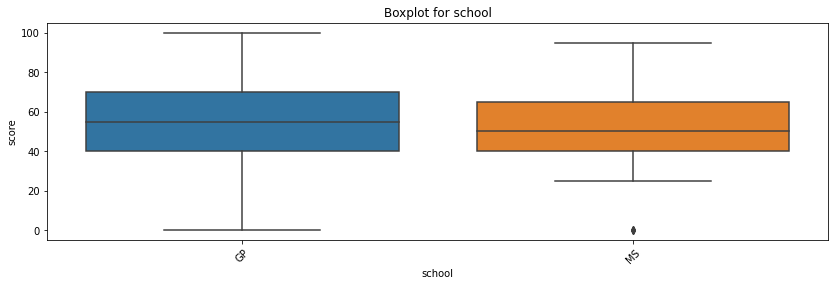

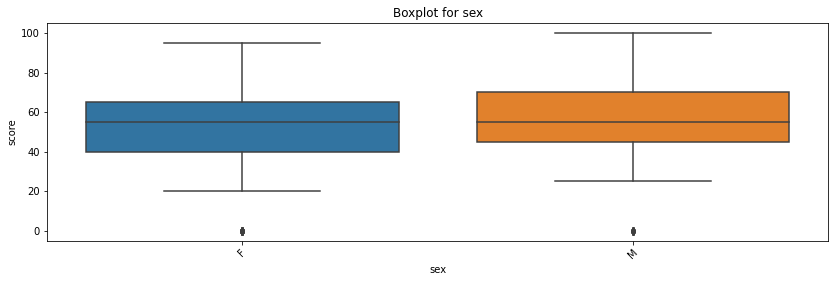

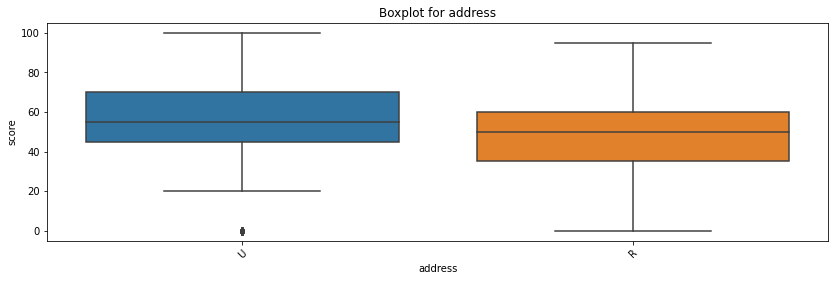

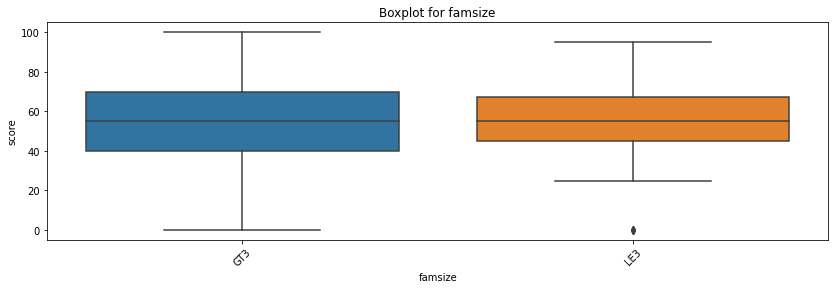

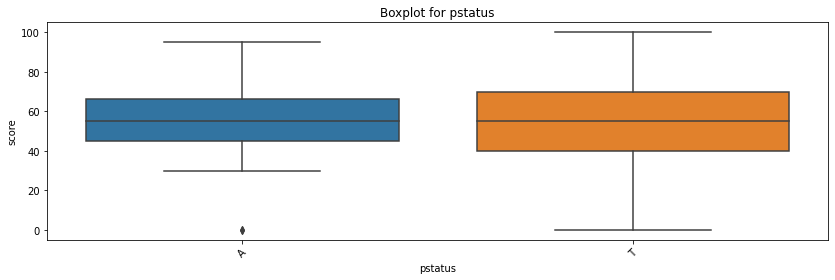

...

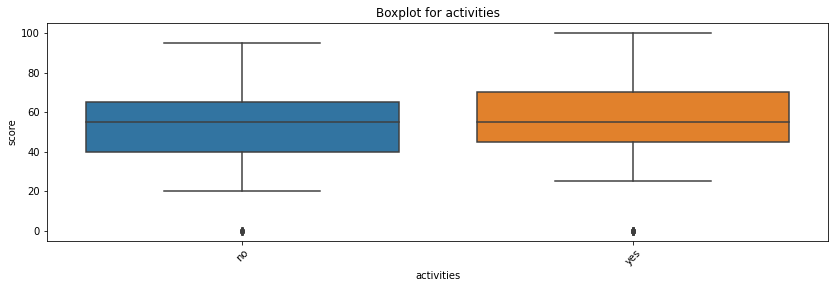

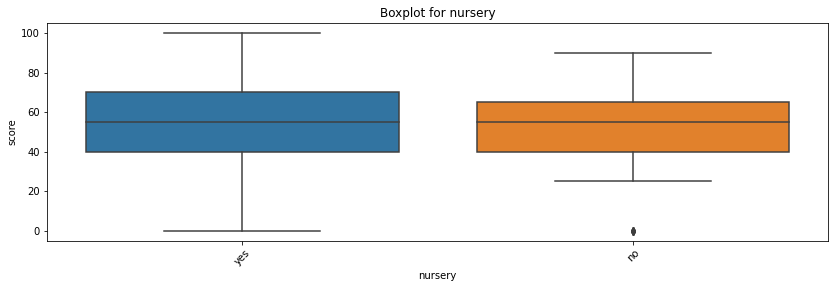

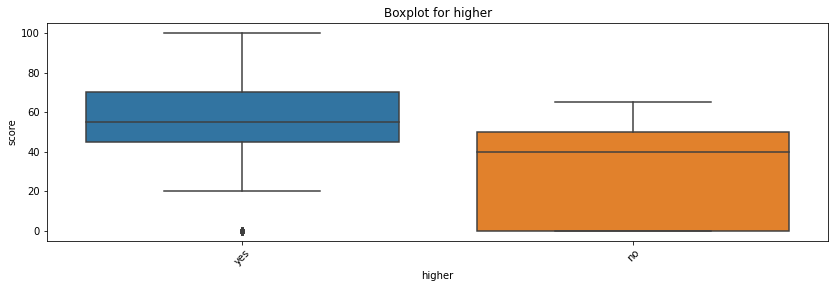

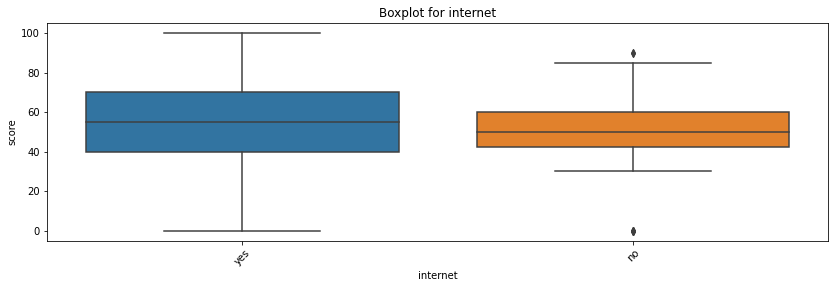

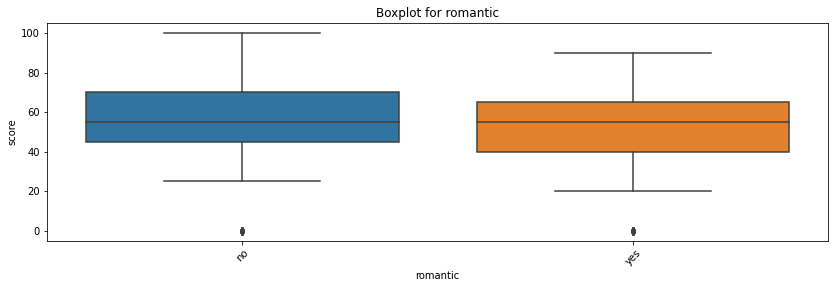

In [270]:
# Проведём анализ номинативных переменных
def get_boxplot(column):
    fig, ax = plt.subplots(figsize = (14, 4))
    sns.boxplot(x=column, y='score', data=sd.loc[sd.loc[:, column].isin(sd.loc[:, column].value_counts().index[0:5])], ax=ax)
    plt.xticks(rotation=45)
    ax.set_title('Boxplot for ' + column)
    plt.show()

for col in cols_str:
    get_boxplot(col)

Анализ графиков показал, что есть значимые изменения в следующих столбцах: mjob, fjob, schoolsup и higher

In [271]:
# Проверим наше предположение, выполнив статистический анализ с помощью теста Стьюдента
# Определим статистическую значимость признаков 
def get_stat_dif(column):
    cols = sd.loc[:, column].value_counts().index
    combinations_all = list(combinations(cols, 2))
    for comb in combinations_all:
        if ttest_ind(sd.loc[sd.loc[:, column] == comb[0], 'score'], 
                     sd.loc[sd.loc[:, column] == comb[1], 'score']).pvalue \
            <= 0.05/len(combinations_all): # Учли поправку Бонферони
            print('Найдены статистически значимые различия для колонки', column)
            break

for col in cols_str:
    get_stat_dif(col)

Найдены статистически значимые различия для колонки mjob


Тест Стьюдента показал, что есть значимые различия для колонки mjob.

Для последующего анализа в модель будут добавлены следующие параметры:
- mjob, fjob, schoolsup и higher

In [272]:
list_= ['mjob', 'fjob', 'schoolsup', 'higher']
list_parameters = list_parameters + list_

#### Проведём анализ столбцов, значения которых являются числами

In [273]:
# Создадим список числовых столбцов
cols_num = [x[0] for x in sd.dtypes.to_dict().items() if str(x[1])=='float64' or str(x[1])=='int64']

# Функция замены NaN на медианное значение в числовых столбцах
def to_median(column,match=None):
    if match == None:
        sd[column][sd[column].isna()] = sd[column].median()
    else:
        sd[column][sd[column] == match] = sd[column].median()

15     82
16    104
17     98
18     82
19     24
20      3
21      1
22      1
Name: age, dtype: int64

count    395.000000
mean      16.696203
std        1.276043
min       15.000000
25%       16.000000
50%       17.000000
75%       18.000000
max       22.000000
Name: age, dtype: float64

<AxesSubplot:xlabel='age'>

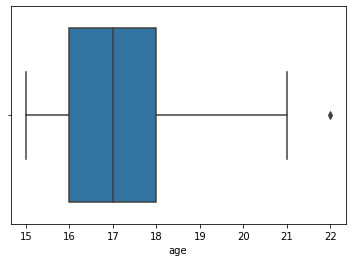

In [274]:
# age - числовой
display(sd.age.value_counts().sort_index()) # Cодержимое столбца
display(sd.age.describe()) # Общие сведения

sns.boxplot(sd.age) # Смотрим распределение признака

- Учащиеся разного возраста от 15 до 22 лет.
- Основная группа учащихся в возрасте от 16 до 18 лет. Один учащийся 22 лет выбивается из общей массы, но это не является выбросом, так как это не протеворечит изначальному условию задачи.

4.0    131
2.0    102
3.0     97
1.0     59
0.0      3
NaN      3
Name: medu, dtype: int64

count    392.000000
mean       2.750000
std        1.098127
min        0.000000
25%        2.000000
50%        3.000000
75%        4.000000
max        4.000000
Name: medu, dtype: float64

<AxesSubplot:>

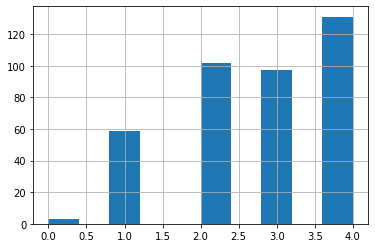

In [275]:
# Medu - числовой (качественный признак)
medu = sd.medu.value_counts(dropna=False)
display(medu) # Cодержимое столбца. Есть небольшое количество пропусков
display(sd.medu.describe())

sd.medu.hist()

In [276]:
# Заменим пропуски на медианное значение
to_median('medu')
medu_p = sd.medu.value_counts(normalize=True, dropna=False)
display(medu_p)

4.0    0.331646
2.0    0.258228
3.0    0.253165
1.0    0.149367
0.0    0.007595
Name: medu, dtype: float64

В таблице представлен уровень образования матерей учащихся.
- 0 - нет образования, 
- 1 - 4 класса, 
- 2 - 5-9 классы, 
- 3 - среднее специальное или 11 классов, 
- 4 - высшее

Есть небольшое количество пропусков, которое мы заменели на медианное значение

Выводы: Больше половины матерей учащихся, по меньшей мере, окончили 11 классов

2.0     106
3.0      96
4.0      88
1.0      78
NaN      24
0.0       2
40.0      1
Name: fedu, dtype: int64

count    371.000000
mean       2.614555
std        2.228732
min        0.000000
25%        2.000000
50%        2.000000
75%        3.000000
max       40.000000
Name: fedu, dtype: float64

<AxesSubplot:>

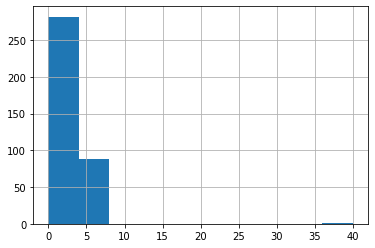

In [277]:
# Fedu - Образование отцов, числовой (качественный признак)
fedu = sd.fedu.value_counts(dropna=False)

display(fedu) # Cодержимое столбца. Есть небольшое количество пропусков
display(sd.fedu.describe())

sd.fedu.hist()

In [278]:
# Одно значение 40.0 - явная ошибка (опечатка). Заменим на верное значение - 4.0
sd.fedu[sd.fedu == 40.0] = 4.0

# Заменим пропуски на медианное значение
to_median('fedu')

fedu_p = sd.fedu.value_counts(normalize=True, dropna=False)
display(fedu_p)

2.0    0.329114
3.0    0.243038
4.0    0.225316
1.0    0.197468
0.0    0.005063
Name: fedu, dtype: float64

В таблице представлен уровень образования отцов учащихся.
- 0 - нет образования, 
- 1 - 4 класса, 
- 2 - 5-9 классы, 
- 3 - среднее специальное или 11 классов, 
- 4 - высшее

Была обнаружена опечатка, которую мы заменили на значение больше подходящее по смыслу.

Есть небольшое количество пропусков, которое мы заменели на медианное значение.

Вывод: Около половины отцов учащихся не имеют оконченного среднего образования.

1.0    242
2.0     96
NaN     28
3.0     22
4.0      7
Name: traveltime, dtype: int64

count    367.000000
mean       1.438692
std        0.694181
min        1.000000
25%        1.000000
50%        1.000000
75%        2.000000
max        4.000000
Name: traveltime, dtype: float64

<AxesSubplot:>

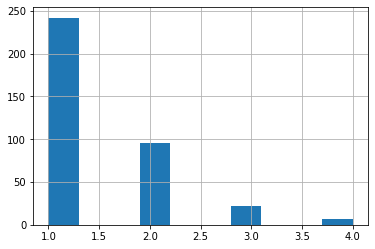

In [279]:
# traveltime - Время в пути до школы (числовой, качественный признак)
traveltime = sd.traveltime.value_counts(dropna=False)

display(traveltime) # Cодержимое столбца. Есть большое количество пропусков

display(sd.traveltime.describe())

sd.traveltime.hist()

In [280]:
# Заменим пропуски на медианное значение
to_median('traveltime')

traveltime_p = sd.traveltime.value_counts(normalize=True, dropna=False)
display(traveltime_p)

1.0    0.683544
2.0    0.243038
3.0    0.055696
4.0    0.017722
Name: traveltime, dtype: float64

Время в пути до школы
- 1 - <15 мин., 
- 2 - 15-30 мин., 
- 3 - 30-60 мин., 
- 4 - >60 мин.

Есть большое количество пропусков, которое мы заменели на медианное значение.

Выводы: Больше половины учащихся добираются до школы менее, чем за 15 минут

2.0    194
1.0    103
3.0     64
4.0     27
NaN      7
Name: studytime, dtype: int64

count    388.000000
mean       2.038660
std        0.842078
min        1.000000
25%        1.000000
50%        2.000000
75%        2.000000
max        4.000000
Name: studytime, dtype: float64

<AxesSubplot:>

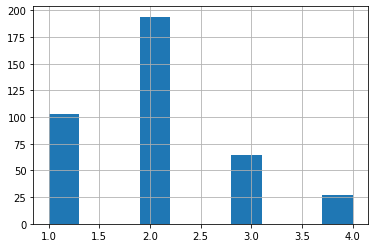

In [281]:
# studytime - Время в пути до школы (числовой, качественный признак)
studytime = sd.studytime.value_counts(dropna=False)

display(studytime) # Cодержимое столбца. Есть большое количество пропусков

display(sd.studytime.describe())

sd.studytime.hist()

In [282]:
# Заменим пропуски на медианное значение
to_median('studytime')

studytime_p = sd.studytime.value_counts(normalize=True, dropna=False)
display(studytime_p)

2.0    0.508861
1.0    0.260759
3.0    0.162025
4.0    0.068354
Name: studytime, dtype: float64

Время на учёбу помимо школы в неделю (1 - <2 часов, 2 - 2-5 часов, 3 - 5-10 часов, 4 - >10 часов)

Выводы: половина учащихся тратят на учёбу вне школы от 2 до 5 часов

-6.0     194
-3.0     103
-9.0      64
-12.0     27
 NaN       7
Name: st_granular, dtype: int64

count    388.000000
mean      -6.115979
std        2.526235
min      -12.000000
25%       -6.000000
50%       -6.000000
75%       -3.000000
max       -3.000000
Name: st_granular, dtype: float64

<AxesSubplot:>

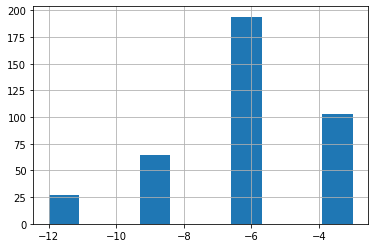

In [283]:
# st_granular - (studytime, angular) неизвестный столбец (числовой)
st_granular = sd.st_granular.value_counts(dropna=False)
display(st_granular) 
display(sd.st_granular.describe()) # Cодержимое столбца. Есть небольшое количество пропусков

sd.st_granular.hist()

In [284]:
# Заменим пропуски на медианное значение
to_median('st_granular')

st_granular_p = sd.st_granular.value_counts(normalize=True, dropna=False)
display(st_granular_p)

-6.0     0.508861
-3.0     0.260759
-9.0     0.162025
-12.0    0.068354
Name: st_granular, dtype: float64

0.0    293
1.0     49
NaN     22
2.0     16
3.0     15
Name: failures, dtype: int64

count    373.000000
mean       0.337802
std        0.743135
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max        3.000000
Name: failures, dtype: float64

<AxesSubplot:>

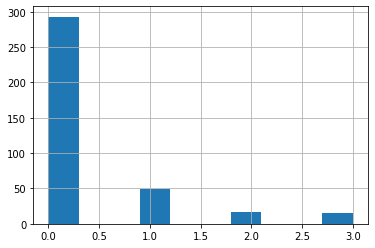

In [285]:
# failures - количество внеучебных неудач (числовой)
failures = sd.failures.value_counts(dropna=False)
display(failures) # Cодержимое столбца. Есть большое количество пропусков

display(sd.failures.describe())

sd.failures.hist()

In [286]:
# Заменим пропуски на медианное значение
to_median('failures')

failures_p = sd.failures.value_counts(normalize=True, dropna=False)
display(failures_p)

0.0    0.797468
1.0    0.124051
2.0    0.040506
3.0    0.037975
Name: failures, dtype: float64

Есть большое количество пропусков, которое мы заменели на медианное значение.

Выводы: У большего количесто учащихся (~80%) нет внеучебных неудач

 4.0    182
 5.0     99
 3.0     62
 NaN     27
 2.0     17
 1.0      7
-1.0      1
Name: famrel, dtype: int64

count    368.000000
mean       3.937500
std        0.927277
min       -1.000000
25%        4.000000
50%        4.000000
75%        5.000000
max        5.000000
Name: famrel, dtype: float64

<AxesSubplot:>

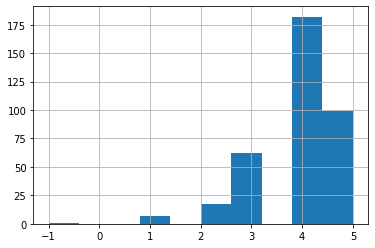

In [287]:
# famrel — семейные отношения (числовой, качественный)
famrel = sd.famrel.value_counts(dropna=False)
display(famrel)
display(sd.famrel.describe()) # Есть большое количество пропусков

sd.famrel.hist()

In [288]:
# Одно значение со знаком минус. Это явно ошибка, так как протеворечит условию. Заменим на положительное значение.
sd.famrel[sd.famrel < 0] = 1.0

# Заменим пропуски на медианное значение
to_median('famrel')

famrel_p = sd.famrel.value_counts(normalize=True, dropna=False)
display(famrel_p)

4.0    0.529114
5.0    0.250633
3.0    0.156962
2.0    0.043038
1.0    0.020253
Name: famrel, dtype: float64

(от 1 - очень плохо до 5 - очень хорошо)

Выводы: Больше половины учащихся имеют по меньшей мере хорошие семейные отношения

3.0    153
4.0    112
2.0     63
5.0     38
1.0     18
NaN     11
Name: freetime, dtype: int64

count    384.000000
mean       3.231771
std        0.993940
min        1.000000
25%        3.000000
50%        3.000000
75%        4.000000
max        5.000000
Name: freetime, dtype: float64

<AxesSubplot:>

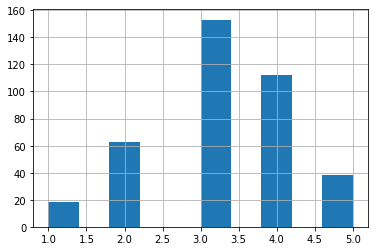

In [289]:
# freetime — свободное время после школы (от 1 - очень мало до 5 - очень мого)
freetime = sd.freetime.value_counts(dropna=False)
display(freetime)
display(sd.freetime.describe())

sd.freetime.hist()

In [290]:
# Заменим пропуски на медианное значение
to_median('freetime')

freetime_p = sd.freetime.value_counts(normalize=True, dropna=False)
display(freetime_p)

3.0    0.415190
4.0    0.283544
2.0    0.159494
5.0    0.096203
1.0    0.045570
Name: freetime, dtype: float64

Выводы: Половина учащихся имеет среднее количество свободного времени

3.0    127
2.0    101
4.0     84
5.0     52
1.0     23
NaN      8
Name: goout, dtype: int64

count    387.000000
mean       3.105943
std        1.115896
min        1.000000
25%        2.000000
50%        3.000000
75%        4.000000
max        5.000000
Name: goout, dtype: float64

<AxesSubplot:>

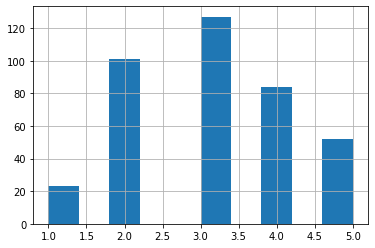

In [291]:
# goout — проведение времени с друзьями (от 1 - очень мало до 5 - очень много)
goout = sd.goout.value_counts(dropna=False)
display(goout)
display(sd.goout.describe())

sd.goout.hist()

In [292]:
# Заменим пропуски на медианное значение
to_median('goout')

goout_p = sd.goout.value_counts(normalize=True, dropna=False)
display(goout_p)

3.0    0.341772
2.0    0.255696
4.0    0.212658
5.0    0.131646
1.0    0.058228
Name: goout, dtype: float64

5.0    138
3.0     89
4.0     63
1.0     47
2.0     43
NaN     15
Name: health, dtype: int64

count    380.000000
mean       3.531579
std        1.396019
min        1.000000
25%        3.000000
50%        4.000000
75%        5.000000
max        5.000000
Name: health, dtype: float64

<AxesSubplot:>

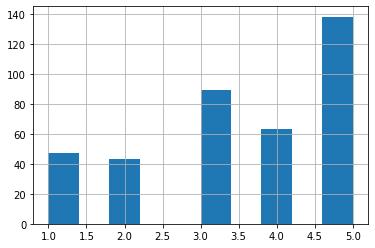

In [293]:
# health — текущее состояние здоровья (от 1 - очень плохо до 5 - очень хорошо)
health = sd.health.value_counts(dropna=False)
display(health)
display(sd.health.describe())

sd.health.hist()

In [294]:
# Заменим пропуски на медианное значение
to_median('health')

health_p = sd.health.value_counts(normalize=True, dropna=False)
display(health_p)

5.0    0.349367
3.0    0.225316
4.0    0.197468
1.0    0.118987
2.0    0.108861
Name: health, dtype: float64

0.0      111
2.0       60
4.0       53
6.0       31
8.0       21
10.0      17
12.0      12
NaN       12
14.0      12
3.0        8
16.0       7
7.0        6
5.0        5
18.0       5
20.0       4
1.0        3
22.0       3
9.0        3
13.0       2
15.0       2
11.0       2
25.0       1
54.0       1
385.0      1
26.0       1
56.0       1
24.0       1
212.0      1
21.0       1
75.0       1
30.0       1
19.0       1
38.0       1
40.0       1
23.0       1
17.0       1
28.0       1
Name: absences, dtype: int64

count    383.000000
mean       7.279373
std       23.465197
min        0.000000
25%        0.000000
50%        4.000000
75%        8.000000
max      385.000000
Name: absences, dtype: float64

<AxesSubplot:xlabel='absences'>

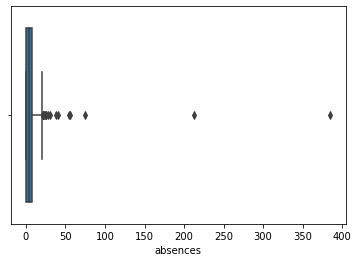

In [295]:
# absences — количество пропущенных занятий
absences = sd.absences.value_counts(dropna=False)

display(absences)
display(sd.absences.describe())

#sd.absences.hist()
sns.boxplot(sd.absences)

In [296]:
# Заменим пропуски на медианное значение
to_median('absences')

#sns.boxplot(sd.absences)
#sd.absences.hist()

# Распределение ассиметричное, смещено вправо за счёт редких, но длительных пропусков в занятиях
# Так как такие события встречаются редко (по 1 случаю), но при этом сильно влияют на картину распределения заменим эти значения на медиану
sd.absences[sd.absences > 200] = sd.absences.median()

# Стоить также заметить на некую цикличность в пропущенных занятиях. 
# Чётное и нечётное количество пропусков заметно отличаются и представлены в столбце последовательно. Прослеживается явная тенденция
display(absences.sort_index()) 

# Заменим каждое нечётное количество пропущенных занятий на ближайшее чётное
def change(number):
    number = int(number)
    if number%2 != 0:
        number = number - 1
    return float(number)

sd.absences = sd.absences.apply(change)
display(sd.absences.value_counts().sort_index())
display(sd.absences.describe())

0.0      111
1.0        3
2.0       60
3.0        8
4.0       53
5.0        5
6.0       31
7.0        6
8.0       21
9.0        3
10.0      17
11.0       2
12.0      12
13.0       2
14.0      12
15.0       2
16.0       7
17.0       1
18.0       5
19.0       1
20.0       4
21.0       1
22.0       3
23.0       1
24.0       1
25.0       1
26.0       1
28.0       1
30.0       1
38.0       1
40.0       1
54.0       1
56.0       1
75.0       1
212.0      1
385.0      1
NaN       12
Name: absences, dtype: int64

0.0     114
2.0      68
4.0      72
6.0      37
8.0      24
10.0     19
12.0     14
14.0     14
16.0      8
18.0      6
20.0      5
22.0      4
24.0      2
26.0      1
28.0      1
30.0      1
38.0      1
40.0      1
54.0      1
56.0      1
74.0      1
Name: absences, dtype: int64

count    395.000000
mean       5.594937
std        7.901550
min        0.000000
25%        0.000000
50%        4.000000
75%        8.000000
max       74.000000
Name: absences, dtype: float64

0.0      37
20.0      1
25.0      7
30.0     15
35.0      9
40.0     31
45.0     27
50.0     54
55.0     46
60.0     31
65.0     31
70.0     27
75.0     33
80.0     16
85.0      6
90.0     12
95.0      5
100.0     1
NaN       6
Name: score, dtype: int64

count    389.000000
mean      52.262211
std       22.919022
min        0.000000
25%       40.000000
50%       55.000000
75%       70.000000
max      100.000000
Name: score, dtype: float64

<AxesSubplot:xlabel='score'>

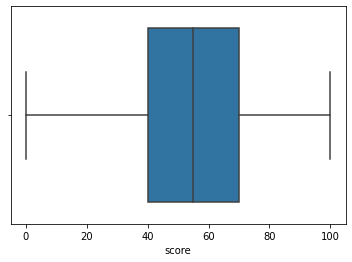

In [297]:
# score — баллы по госэкзамену по математике
#sd.score.hist()
score = sd.score.value_counts(dropna=False)

display(score.sort_index())
display(sd.score.describe())

sns.boxplot(sd.score)

In [298]:
# Имеется небольшое количество пропусков.
# Так как это целевая переменная, то пустые значения мы удалим из общей таблицы
sd.score.dropna(inplace=True)
display(sd.score.value_counts())

# Есть большое количество оценок равное 0.
display(sd[sd.score == 0.0].head())

50.0     54
55.0     46
0.0      37
75.0     33
65.0     31
40.0     31
60.0     31
70.0     27
45.0     27
80.0     16
30.0     15
90.0     12
35.0      9
25.0      7
85.0      6
95.0      5
100.0     1
20.0      1
Name: score, dtype: int64

,school,sex,age,address,famsize,pstatus,medu,fedu,mjob,fjob,reason,guardian,traveltime,studytime,failures,schoolsup,famsup,paid,activities,nursery,st_granular,higher,internet,romantic,famrel,freetime,goout,health,absences,score
128,GP,M,18,R,GT3,T,2.0,2.0,other,other,reputation,mother,1.0,1.0,2.0,no,yes,no,yes,yes,-3.0,yes,yes,no,3.0,3.0,3.0,4.0,0.0,0.0
130,GP,F,15,R,GT3,T,3.0,4.0,services,teacher,course,father,2.0,3.0,2.0,no,yes,no,no,yes,-9.0,yes,yes,yes,4.0,2.0,2.0,5.0,0.0,0.0
131,GP,F,15,U,GT3,T,1.0,1.0,at_home,other,course,mother,3.0,1.0,0.0,no,yes,no,yes,no,-3.0,yes,yes,yes,4.0,3.0,3.0,4.0,0.0,0.0
134,GP,M,15,R,GT3,T,3.0,4.0,at_home,teacher,course,mother,1.0,2.0,0.0,no,yes,no,no,yes,-6.0,yes,no,yes,5.0,3.0,3.0,5.0,0.0,0.0
135,GP,F,15,U,GT3,T,4.0,4.0,services,other,course,mother,1.0,3.0,0.0,no,yes,no,yes,yes,-9.0,yes,yes,yes,4.0,3.0,3.0,5.0,0.0,0.0


In [299]:
# Эти оценки не являюся выбросами. В то же время, судя по данным, почти никто из этих учащихся не пропускал занятия. Скорее всего это ошибки. Заменим их на медиану.
to_median('score', 0.0)
display(sd.score.value_counts())

55.0     83
50.0     54
75.0     33
65.0     31
40.0     31
60.0     31
70.0     27
45.0     27
80.0     16
30.0     15
90.0     12
35.0      9
25.0      7
85.0      6
95.0      5
100.0     1
20.0      1
Name: score, dtype: int64

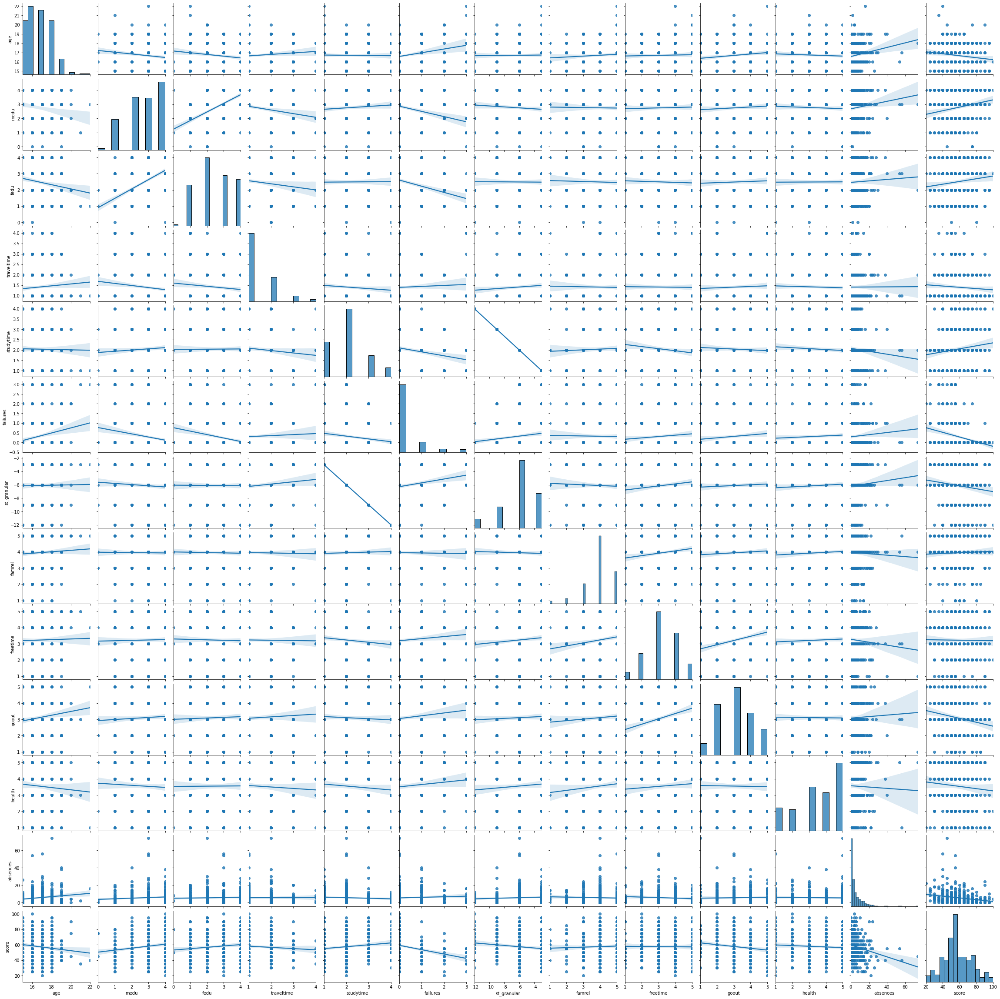

In [300]:
# Проведём корреляяционный анализ числовых колонок
sns.pairplot(sd, kind = 'reg')

In [301]:
# Используем для наглядности матрицу корреляций
sd.corr()

,age,medu,fedu,traveltime,studytime,failures,st_granular,famrel,freetime,goout,health,absences,score
age,1.000000,-0.161375,-0.154781,0.084755,-0.015355,0.228081,0.015355,0.065250,0.026443,0.134069,-0.063892,0.152392,-0.129108
medu,-0.161375,1.000000,0.593116,-0.160877,0.077050,-0.245110,-0.077050,-0.013853,0.026210,0.063361,-0.050991,0.096380,0.181460
fedu,-0.154781,0.593116,1.000000,-0.120629,0.007754,-0.260690,-0.007754,-0.024077,-0.029868,0.039084,0.006132,0.033795,0.121742
traveltime,0.084755,-0.160877,-0.120629,1.000000,-0.094637,0.049670,0.094637,-0.019040,-0.012496,0.051775,-0.044842,0.003416,-0.069488
studytime,-0.015355,0.077050,0.007754,-0.094637,1.000000,-0.166598,-1.000000,0.037638,-0.119014,-0.051090,-0.073674,-0.067709,0.133311
failures,0.228081,-0.245110,-0.260690,0.049670,-0.166598,1.000000,0.166598,-0.017230,0.094826,0.113649,0.075849,0.060611,-0.261198
st_granular,0.015355,-0.077050,-0.007754,0.094637,-1.000000,0.166598,1.000000,-0.037638,0.119014,0.051090,0.073674,0.067709,-0.133311
famrel,0.065250,-0.013853,-0.024077,-0.019040,0.037638,-0.017230,-0.037638,1.000000,0.165324,0.074217,0.085947,-0.039950,0.038590
freetime,0.026443,0.026210,-0.029868,-0.012496,-0.119014,0.094826,0.119014,0.165324,1.000000,0.292305,0.060557,-0.073350,-0.012234
goout,0.134069,0.063361,0.039084,0.051775,-0.051090,0.113649,0.051090,0.074217,0.292305,1.000000,-0.014274,0.033327,-0.168344


Колонки studytime и st_granular имеют полную обратную корреляцию, поэтому один из признаков можно убрать. Оставим studytime.

По полученной информации для использования в модели можно оставить следующие слабокоррелирующие признаки:
age, medu, fedu, traveltime, studytime,	failures, famrel, freetime, goout, health, absences


In [302]:
list_ = ['age', 'medu', 'fedu', 'traveltime', 'studytime', 'failures', 'famrel', 'freetime', 'goout', 'health', 'absences']
list_parameters = list_parameters + list_

In [303]:
sd_model = sd.loc[:, list_parameters]
sd_model.head()

,mjob,fjob,schoolsup,higher,age,medu,fedu,traveltime,studytime,failures,famrel,freetime,goout,health,absences
0,at_home,teacher,yes,yes,18,4.0,4.0,2.0,2.0,0.0,4.0,3.0,4.0,3.0,6.0
1,at_home,other,no,yes,17,1.0,1.0,1.0,2.0,0.0,5.0,3.0,3.0,3.0,4.0
2,at_home,other,yes,yes,15,1.0,1.0,1.0,2.0,3.0,4.0,3.0,2.0,3.0,10.0
3,health,other,no,yes,15,4.0,2.0,1.0,3.0,0.0,3.0,2.0,2.0,5.0,2.0
4,other,other,no,yes,16,3.0,3.0,1.0,2.0,0.0,4.0,3.0,2.0,5.0,4.0


### 4. Выводы


Итак, в результате EDA для анализа влияния условий жизни учащихся на их успеваемость были получены следующие выводы:

- В данных есть пустые значения. Только 3 столбца (school, age, sex) не имеют пропусков. Для обогощения данных пропуски в остальных столбцах были заменены на медианные значения и моду.
- В колонке absences были обнаружены выбросы и некоторая неоднозначная последовательность, что может означать на некоторое искусственное происхождение этих данных. В остальных столбцах выбросов нет. Данные достаточно чистые.
- Полная отрицательная корреляция параметров studytime и st_granular, говорит об обратной зависимости этих двух признаков. Поэтому один из признаков можно не использовать. Сведений о назначении колонки st_granular предоставлено не было, поэтому было решено не брать этот параметр для последующего анализа.
- Самые важные параметры, которые предлагается использовать в дальнейшем для построения модели, это:


In [337]:
sd_model.columns.to_list()

['mjob',
 'fjob',
 'schoolsup',
 'higher',
 'age',
 'medu',
 'fedu',
 'traveltime',
 'studytime',
 'failures',
 'famrel',
 'freetime',
 'goout',
 'health',
 'absences']